# US

STATA에서 step01과 step03을 거친이후에 가능

In [5]:
using Plots, CSV, DataFrames, XLSX

In [6]:
# 데이터 로드
OMPS = CSV.read("OMPS.csv", DataFrame)
OMPS = OMPS[:, 2]

HP_data = CSV.read("Zillow.csv", DataFrame, header=true)
CPI_data = XLSX.readdata("BLS_CPI_MSA.xlsx", "CPI", "B3:H293");

In [7]:
CPI_matching = [5 7 6 3 3 3 1 3 3 1 4 4 7 2 4 2 4 3 4 3 2 3 3 3 4 1 4 3 4 2]

1×30 Matrix{Int64}:
 5  7  6  3  3  3  1  3  3  1  4  4  7  …  4  3  2  3  3  3  4  1  4  3  4  2

In [8]:
@time begin
    
    # metro 별 분석
    Metro=30
    # 외부에서 딕셔너리 초기화
    beta_dict = Dict()
    level_dict = Dict()
    
    # 주요변수 설정
    H = 40
    M = 12
    I = 2
    MPS_start = 157;
    N = 291

    # 2001m2~2019m12
    S = OMPS[MPS_start:end] 
    N_s = length(S)

    start_idx = 14; # 2001m2
    # shock variables
    if I!=0
        S_lag = zeros(N_s,I)
        Threads.@threads for i=1:I
            S_lag[:,i]= OMPS[MPS_start-i:end-i]
        end
    end

    for metro=1:Metro
        filtered_data = HP_data[HP_data.metro_id .== metro, :]
        # 2000m1~2024m2
        metro_data = filtered_data[:,4]
        metro_data = reshape(metro_data, N,:)
        ~, K = size(metro_data)

        b_h = zeros(H+1, K);
        hp_lv = zeros(1,K);
        
        def_data = zeros(N,K)


        Threads.@threads for k=1:K           
            # deflate
            def_data[:,k] = log.(metro_data[:,k]).-log.(CPI_data[:,CPI_matching[metro]])
            # HP level
            hp_lv[k] = log.(metro_data[end-3,k])
            Y_lag = zeros(N_s,M)
            for m=1:M
                Y_lag[:,m]=def_data[start_idx-m:(start_idx+N_s-1)-m,k] - def_data[start_idx-m-1:(start_idx+N_s-1)-m-1,k]
            end
            if I!=0
                X = [S S_lag Y_lag ones(N_s,1)]
            else
                X = [S Y_lag ones(N_s,1)]
            end
            sample_num, explain_num = size(X)
            df = sample_num-explain_num
    
            Threads.@threads for h=0:H
                # regression
                dep = def_data[start_idx+h:(start_idx+N_s-1)+h,k]-def_data[start_idx-1:(start_idx+N_s-1)-1,k]
                beta = (X'*X) \ (X'*dep)        
                # save
                b_h[h+1,k] = beta[1]
            end
        end
        
        beta_dict[metro] = b_h
        level_dict[metro] = hp_lv
    end
    
end

  5.794863 seconds (10.52 M allocations: 3.057 GiB, 5.37% gc time, 37.23% compilation time)


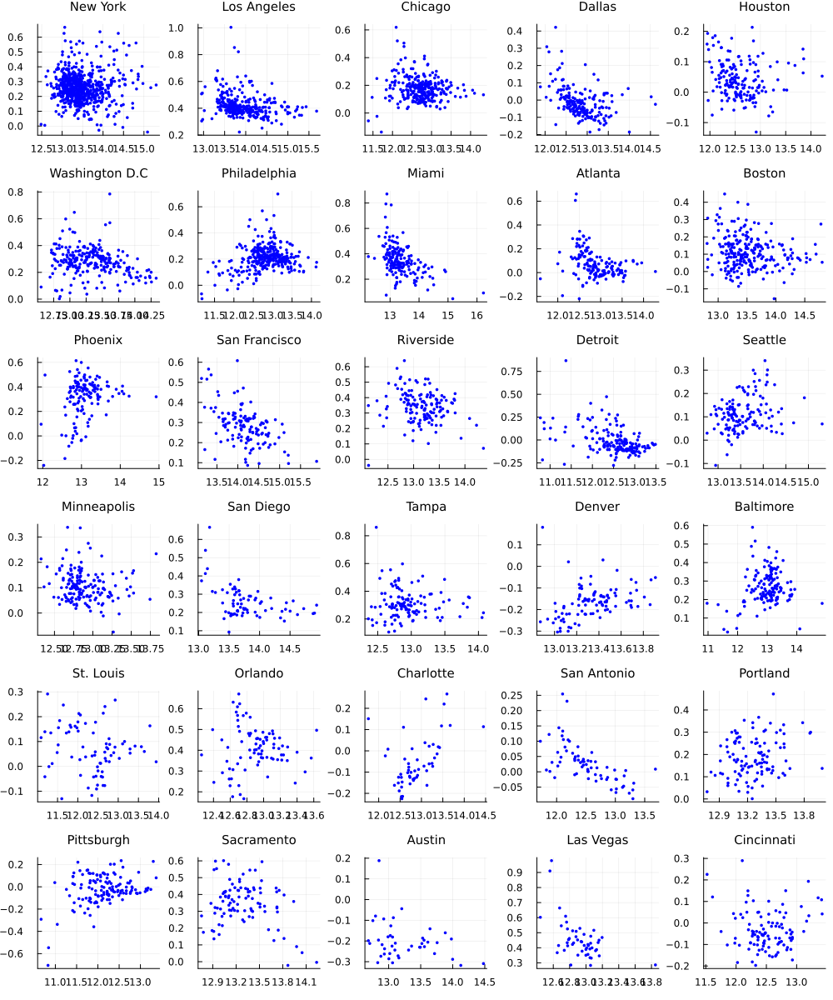

In [9]:
# Figure
city = [
    "New York", "Los Angeles", "Chicago", "Dallas", "Houston", "Washington D.C",
    "Philadelphia", "Miami", "Atlanta", "Boston", "Phoenix", "San Francisco",
    "Riverside", "Detroit", "Seattle", "Minneapolis", "San Diego", "Tampa",
    "Denver", "Baltimore", "St. Louis", "Orlando", "Charlotte", "San Antonio",
    "Portland", "Pittsburgh", "Sacramento", "Austin", "Las Vegas", "Cincinnati"
]
figures= []
peak = 37  # after 36 month

for metro =1:Metro
    F = scatter(level_dict[metro]', -beta_dict[metro][peak, :], label="", title=city[metro], titlefontsize=10, markerstrokewidth=0, markersize=2, markercolor=:blue)
    push!(figures, F)
end

plot(figures..., layout=(6, 5), size=(1000, 1200), margin=1Plots.px)
#savefig("US_30_metro.png")

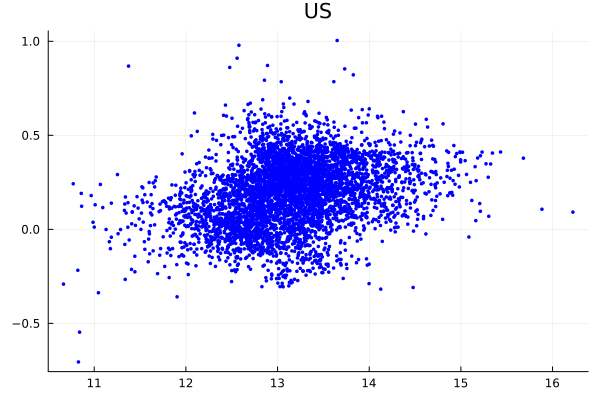

In [10]:
F2 = scatter(level_dict[1]', -beta_dict[1][peak, :], label="", title="US", markerstrokewidth=0, markersize=2, markercolor=:blue)
for metro =2:Metro
    scatter!(F2, level_dict[metro]', -beta_dict[metro][peak, :], label="", markerstrokewidth=0, markersize=2, markercolor=:blue)
end
display(F2)

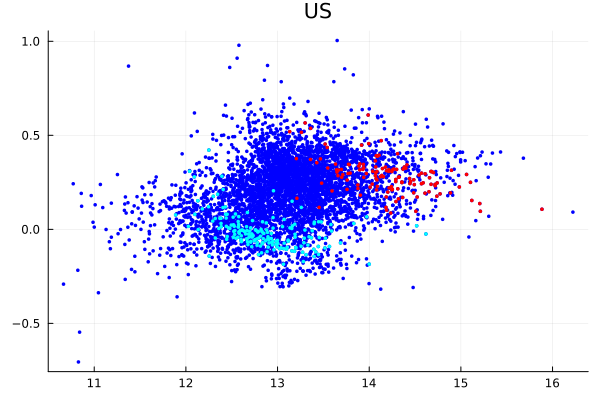

In [14]:
F3 = scatter(level_dict[1]', -beta_dict[1][peak, :], label="", markerstrokewidth=0, markersize=2, markercolor=:blue)
for metro =2:Metro
    scatter!(F3, level_dict[metro]', -beta_dict[metro][peak, :], label="", markerstrokewidth=0, markersize=2, markercolor=:blue)
end
scatter!(F3, level_dict[12]', -beta_dict[12][peak, :], label="", title="US", markerstrokewidth=0, markersize=2, markercolor=:red)
scatter!(F3, level_dict[4]', -beta_dict[4][peak, :], label="", markerstrokewidth=0, markersize=2, markercolor=:cyan)
display(F3)

# Asymetry

In [18]:
@time begin
    
    # metro 별 분석
    Metro=30
    # 외부에서 딕셔너리 초기화
    beta_EMP_dict = Dict()
    beta_CMP_dict = Dict()
    level_dict = Dict()
    
    # 주요변수 설정
    H = 40
    M = 12
    I = 2
    MPS_start = 157;
    N = 291

    # 2001m2~2019m12
    S = OMPS[MPS_start:end] 
    N_s = length(S)
    S_EMP = OMPS[MPS_start:end].*(S.<0) 
    S_CMP = OMPS[MPS_start:end].*(S.>0)

    start_idx = 14; # 2001m2
    # shock variables
    if I!=0
        S_lag = zeros(N_s,I)
        Threads.@threads for i=1:I
            S_lag[:,i]= OMPS[MPS_start-i:end-i]
        end
    end

    for metro=1:Metro
        filtered_data = HP_data[HP_data.metro_id .== metro, :]
        # 2000m1~2024m2
        metro_data = filtered_data[:,4]
        metro_data = reshape(metro_data, N,:)
        ~, K = size(metro_data)

        b_emp_h = zeros(H+1, K);
        b_cmp_h = zeros(H+1, K);
        hp_lv = zeros(1,K);
        
        def_data = zeros(N,K)


        Threads.@threads for k=1:K           
            # deflate
            def_data[:,k] = log.(metro_data[:,k]).-log.(CPI_data[:,CPI_matching[metro]])
            # HP level
            hp_lv[k] = log.(metro_data[end-3,k])
            Y_lag = zeros(N_s,M)
            for m=1:M
                Y_lag[:,m]=def_data[start_idx-m:(start_idx+N_s-1)-m,k] - def_data[start_idx-m-1:(start_idx+N_s-1)-m-1,k]
            end
            if I!=0
                X = [S_EMP S_CMP S_lag Y_lag ones(N_s,1)]
            else
                X = [S_EMP S_CMP Y_lag ones(N_s,1)]
            end
            sample_num, explain_num = size(X)
            df = sample_num-explain_num
    
            Threads.@threads for h=0:H
                # regression
                dep = def_data[start_idx+h:(start_idx+N_s-1)+h,k]-def_data[start_idx-1:(start_idx+N_s-1)-1,k]
                beta = (X'*X) \ (X'*dep)        
                # save
                b_emp_h[h+1,k] = beta[1]
                b_cmp_h[h+1,k] = beta[2]
            end
        end
        
        beta_EMP_dict[metro] = b_emp_h
        beta_CMP_dict[metro] = b_cmp_h
        level_dict[metro] = hp_lv
    end
    
end

  4.083265 seconds (8.09 M allocations: 3.017 GiB, 4.50% gc time, 9.67% compilation time)


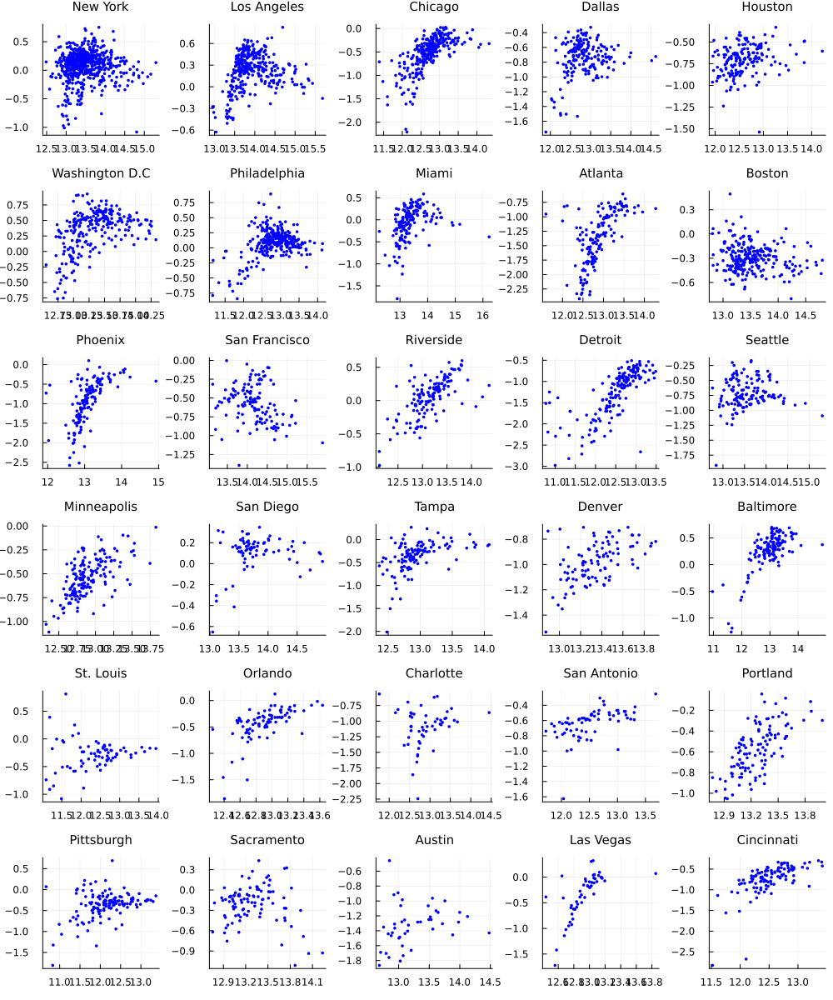

In [29]:
# Figure(expansionary)
EMP_f= []
peak = 37  # after 36 month

for metro =1:Metro
    F = scatter(level_dict[metro]', -beta_EMP_dict[metro][peak, :], label="", title=city[metro], titlefontsize=10, markerstrokewidth=0, markersize=2, markercolor=:blue)
    push!(EMP_f, F)
end

plot(EMP_f..., layout=(6, 5), size=(1000, 1200), margin=1Plots.px)
# savefig("US_EMP.png")

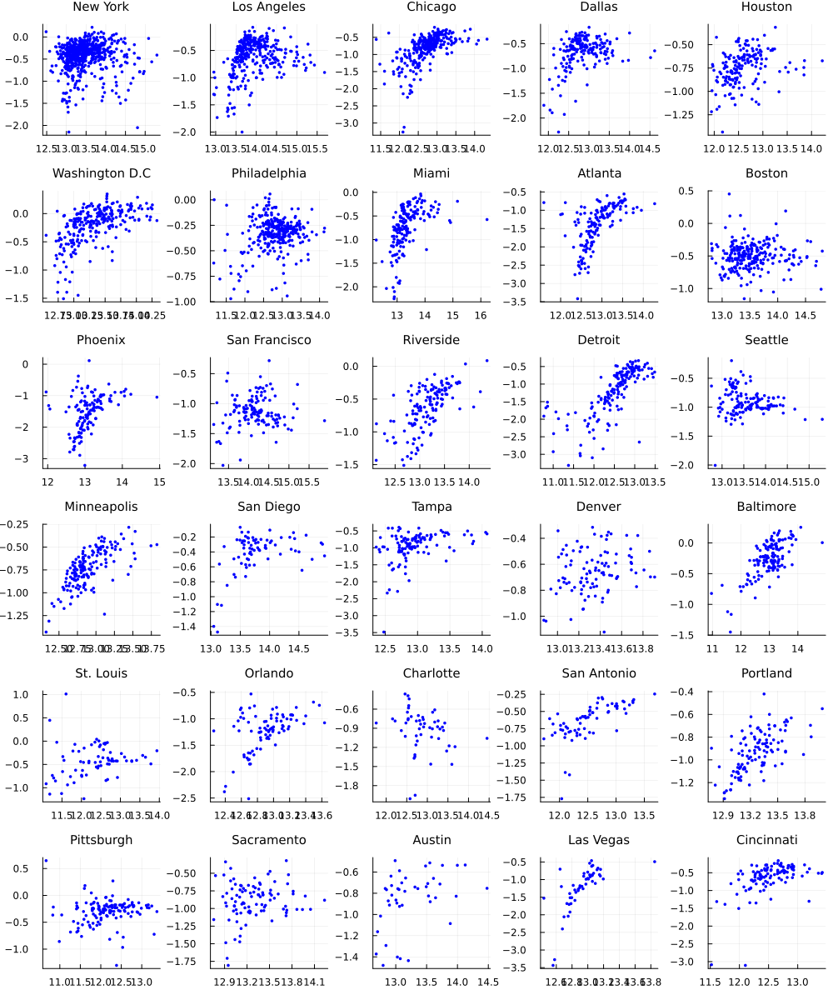

In [30]:
# Figure(contractionary)
CMP_f= []
peak = 37  # after 36 month

for metro =1:Metro
    F = scatter(level_dict[metro]', beta_CMP_dict[metro][peak, :], label="", title=city[metro], titlefontsize=10, markerstrokewidth=0, markersize=2, markercolor=:blue)
    push!(CMP_f, F)
end

plot(CMP_f..., layout=(6, 5), size=(1000, 1200), margin=1Plots.px)
# savefig("US_CMP.png")

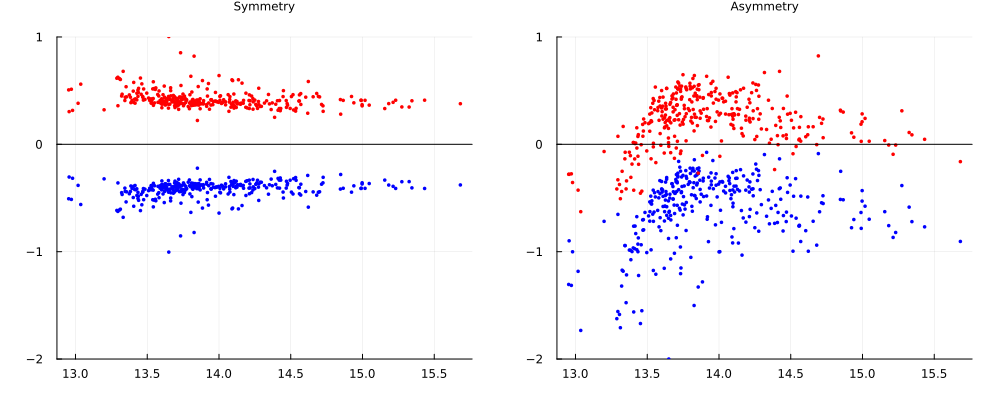

In [41]:
# LA case

LA1 = scatter(level_dict[2]', beta_dict[2][peak, :], label="", title="Symmetry", titlefontsize=8, markerstrokewidth=0, markersize=2, markercolor=:blue, ylim=(-2, 1))
scatter!(LA1, level_dict[2]', -beta_dict[2][peak, :], label="", titlefontsize=8, markerstrokewidth=0, markersize=2, markercolor=:red)
hline!(LA1,[0], label="", color=:black)

LA2 = scatter(level_dict[2]', beta_CMP_dict[2][peak, :], label="", title="Asymmetry", titlefontsize=8, markerstrokewidth=0, markersize=2, markercolor=:blue, ylim=(-2, 1))
scatter!(LA2, level_dict[2]', -beta_EMP_dict[2][peak, :], label="", titlefontsize=8, markerstrokewidth=0, markersize=2, markercolor=:red)
hline!(LA2,[0], label="", color=:black)

plot(LA1, LA2, layout=(1, 2), size=(1000, 400), margin=20Plots.px)
# savefig("LA_symmetric.png")

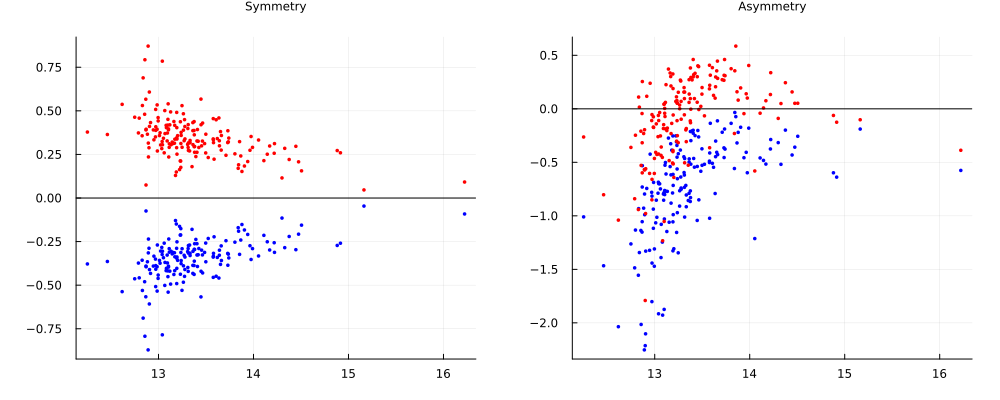

In [56]:
# any city

metro_num = 8

c1 = scatter(level_dict[metro_num]', beta_dict[metro_num][peak, :], label="", title="Symmetry", titlefontsize=8, markerstrokewidth=0, markersize=2, markercolor=:blue)
scatter!(c1, level_dict[metro_num]', -beta_dict[metro_num][peak, :], label="", titlefontsize=8, markerstrokewidth=0, markersize=2, markercolor=:red)
hline!(c1,[0], label="", color=:black)

c2 = scatter(level_dict[metro_num]', beta_CMP_dict[metro_num][peak, :], label="", title="Asymmetry", titlefontsize=8, markerstrokewidth=0, markersize=2, markercolor=:blue)
scatter!(c2, level_dict[metro_num]', -beta_EMP_dict[metro_num][peak, :], label="", titlefontsize=8, markerstrokewidth=0, markersize=2, markercolor=:red)
hline!(c2,[0], label="", color=:black)

plot(c1, c2, layout=(1, 2), size=(1000, 400), margin=20Plots.px)

In [ ]:
# US total

